In [1]:
import MINGLE as mg
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import networkx as nx
import seaborn as sns
from matplotlib.cm import get_cmap
import numpy as np
import os
from scipy.spatial.distance import cdist

c:\Users\annet\anaconda3\envs\annette_MINGLE\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\annet\anaconda3\envs\annette_MINGLE\Lib\site-packages\muon\_core\preproc.py:31: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  if Version(scanpy.__version__) < Version("1.10"):


In [2]:
file_path = r"Z:\MINGLE\Data\Intestine\05_25_HuBMAP_tunit.csv"
cells = mg.pp.read_file(file_path)

C:\Users\annet\Documents\Projects\MINGLE-Annette\MINGLE_scverse\MINGLE\src\MINGLE\pp\preprocessing.py:34: DtypeWarning: Columns (62,63,70) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)
c:\Users\annet\anaconda3\envs\annette_MINGLE\Lib\functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


In [8]:
## to use the palette later

import json

with open(r'Z:\MINGLE\Code\neighborhood_color_palette.json', 'r') as f:
    color_palette = json.load(f)

In [3]:
levels = {
    "tissue": {
        "cluster_col": "Community",
        "neighborhood_col": "Tissue Unit"
    },
    "community": {
        "cluster_col": "Neighborhood",
        "neighborhood_col": "Community"
    },
    "neighborhood": {
        "cluster_col": "Cell Type",
        "neighborhood_col": "Neighborhood"
    }
}

In [4]:

def run_gmm(cells, centroids, cluster_col, neighborhood_col, backend="gpu"):

    if backend == "gpu":
        return mg.tl.gpu_gmm_probability(
            cells,
            centroids,
            cluster_col=cluster_col,
            neighborhood_col=neighborhood_col,
        )

    elif backend == "cpu":
        return mg.tl.cpu_gmm_probability(
            cells,
            centroids,
            cluster_col=cluster_col,
            neighborhood_col=neighborhood_col,
        )

    else:
        raise ValueError("backend must be 'gpu' or 'cpu'")
    
def run_mingle_hierarchy(cells, backend="gpu"):

    results = {}

    for level, params in levels.items():

        cells_level = cells.copy()

        centroids = mg.tl.centroid_Calculation(
            cells_level,
            cluster_col=params["cluster_col"],
            neighborhood_col=params["neighborhood_col"]
        )

        gmm = run_gmm(
            cells_level,
            centroids,
            cluster_col=params["cluster_col"],
            neighborhood_col=params["neighborhood_col"],
            backend=backend
        )

        results[level] = {
            "cells": cells_level,
            "centroids": centroids,
            "gmm": gmm
        }

    return results

results = run_mingle_hierarchy(cells, backend="gpu")

GPU Processing batch 1/126...
GPU Processing batch 2/126...
GPU Processing batch 3/126...
GPU Processing batch 4/126...
GPU Processing batch 5/126...
GPU Processing batch 6/126...
GPU Processing batch 7/126...
GPU Processing batch 8/126...
GPU Processing batch 9/126...
GPU Processing batch 10/126...
GPU Processing batch 11/126...
GPU Processing batch 12/126...
GPU Processing batch 13/126...
GPU Processing batch 14/126...
GPU Processing batch 15/126...
GPU Processing batch 16/126...
GPU Processing batch 17/126...
GPU Processing batch 18/126...
GPU Processing batch 19/126...
GPU Processing batch 20/126...
GPU Processing batch 21/126...
GPU Processing batch 22/126...
GPU Processing batch 23/126...
GPU Processing batch 24/126...
GPU Processing batch 25/126...
GPU Processing batch 26/126...
GPU Processing batch 27/126...
GPU Processing batch 28/126...
GPU Processing batch 29/126...
GPU Processing batch 30/126...
GPU Processing batch 31/126...
GPU Processing batch 32/126...
GPU Processing ba

In [5]:
graphs = {}

for level in results:

    cells_level = results[level]["cells"]
    neighborhood_col = levels[level]["neighborhood_col"]

    prob_cols = sorted(
        cells_level.obs[neighborhood_col].dropna().unique()
    )

    G, top_pairs = mg.tl.build_neighborhood_pair_graph(
        cells_level,
        prob_cols,
        threshold=0.25,
        region_key="unique_region",
        top_n=25
    )

    graphs[level] = {
        "graph": G,
        "pairs": top_pairs
    }

    print(f"Graph built for {level}")

Graph built for tissue
Graph built for community
Graph built for neighborhood


Plotting tissue network


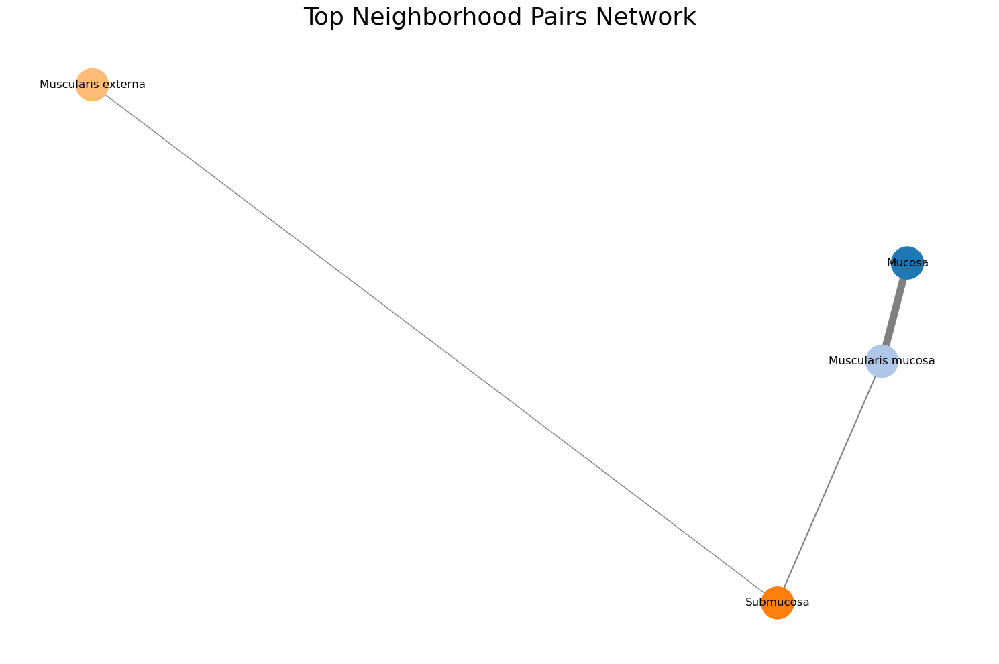

Plotting community network


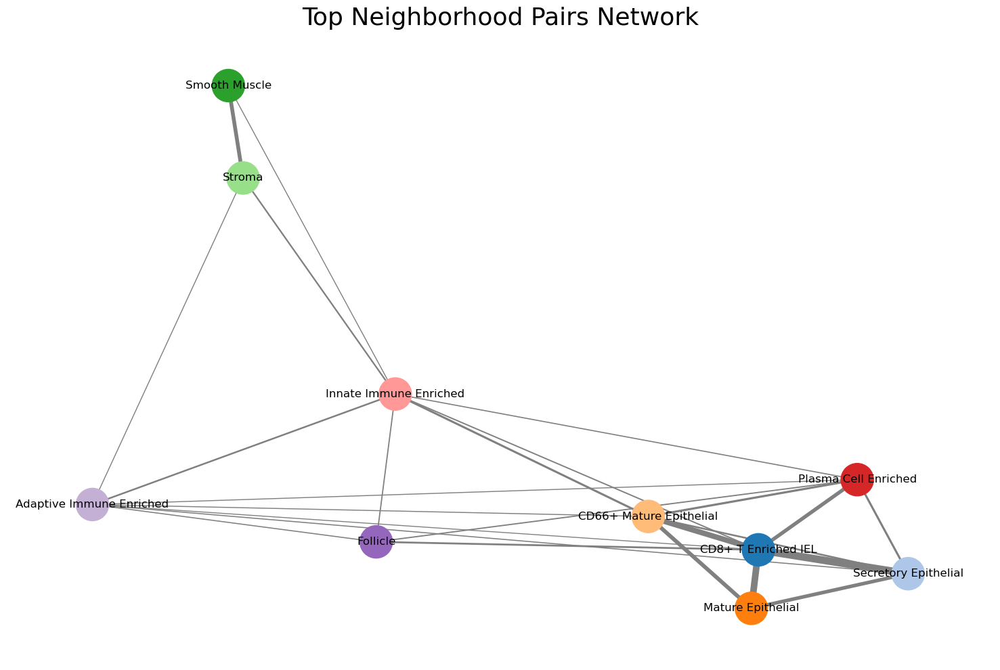

Plotting neighborhood network


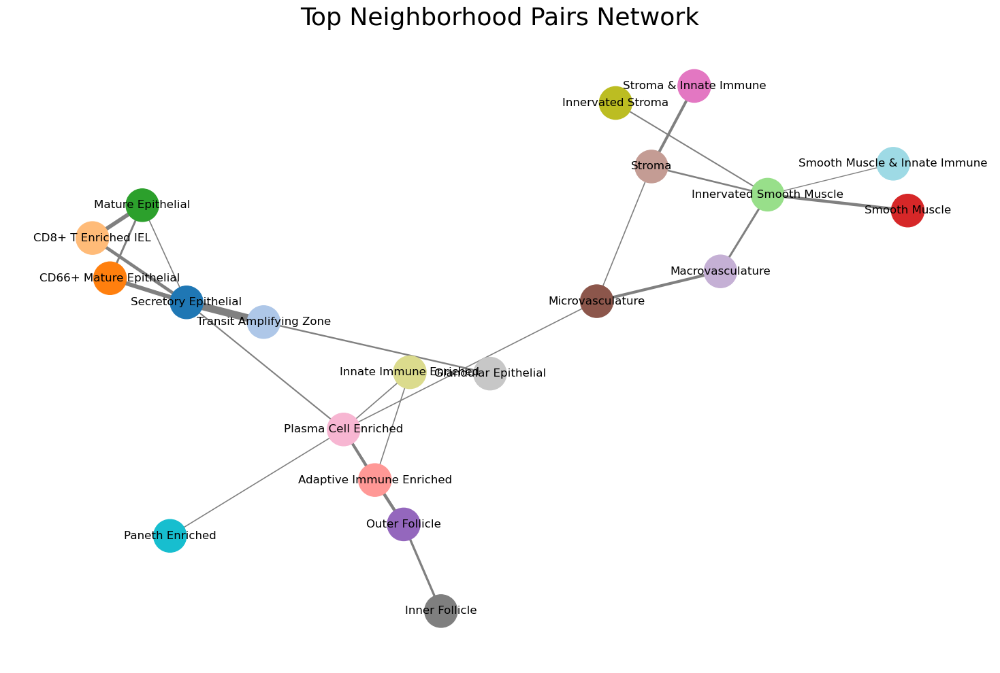

In [6]:
for level in graphs:

    print(f"Plotting {level} network")

    mg.tl.plot_neighborhood_pair_graph(
        results[level]["cells"]
    )

Spatial plot: tissue
Plotting 'B008_Sigmoid': 43783 points


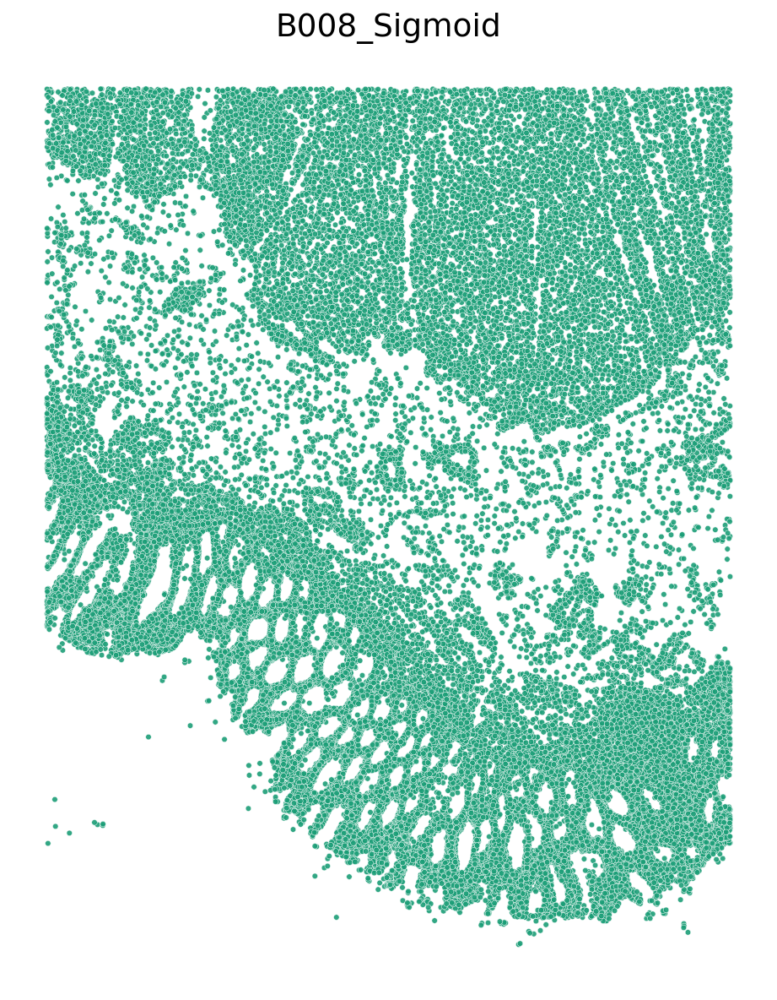

Spatial plot: community
Plotting 'B008_Sigmoid': 43783 points


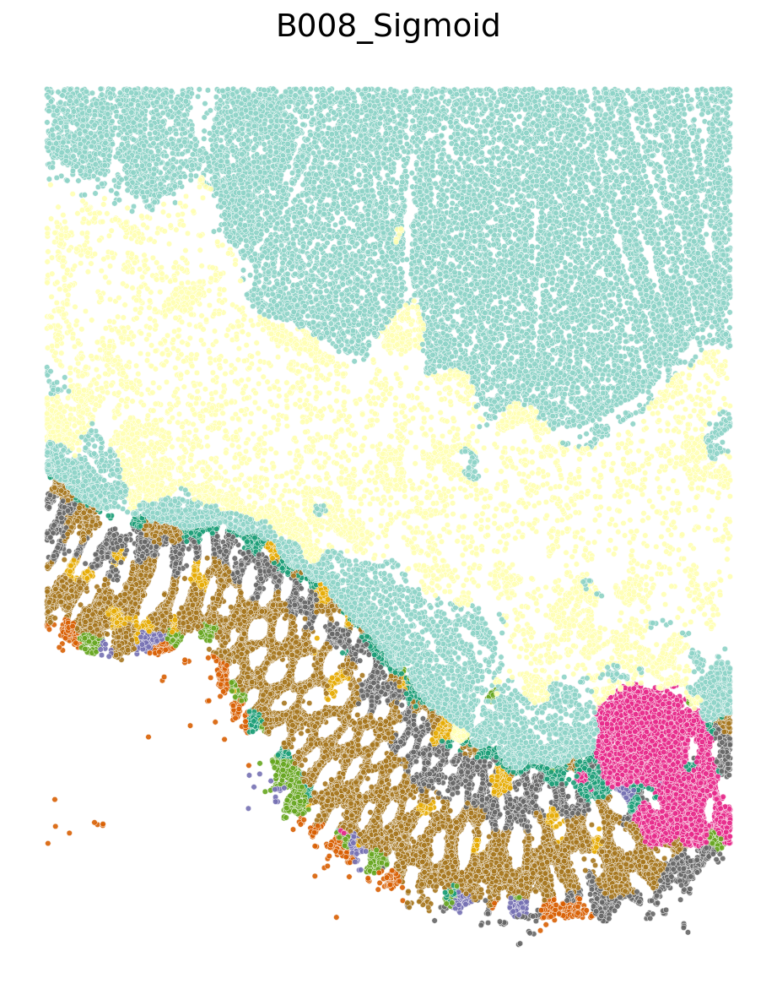

Spatial plot: neighborhood
Plotting 'B008_Sigmoid': 43783 points


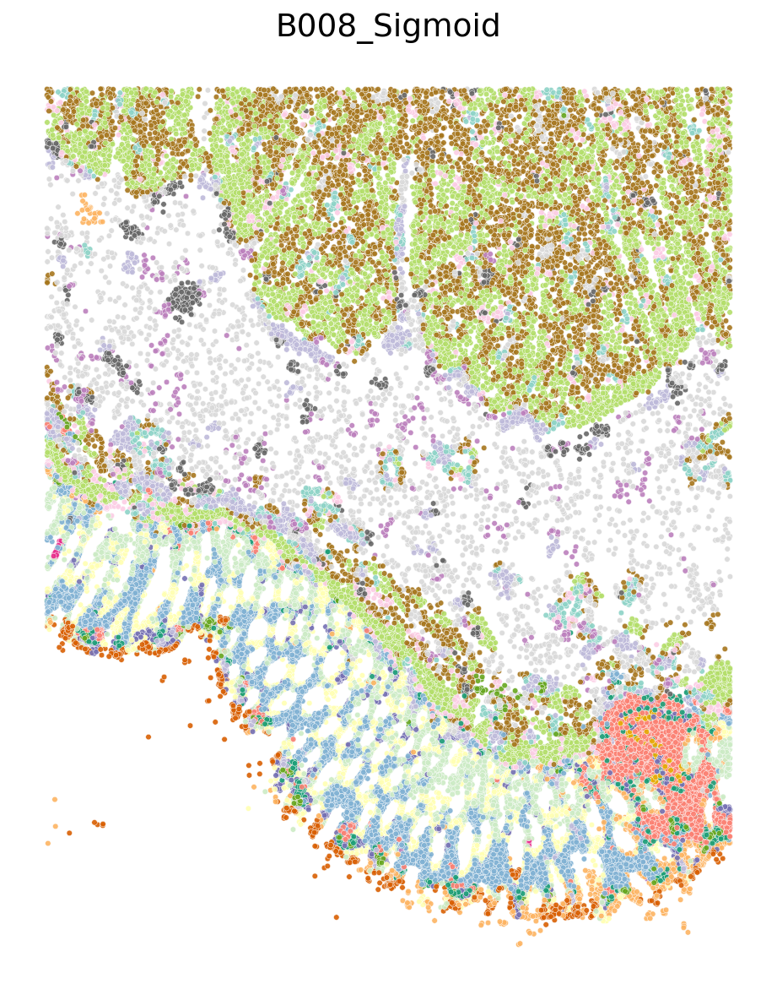

In [26]:
def make_celltype_palette_strict(cells, cell_type_col='Cell_Type'):

    if hasattr(cells, "obs"):
        df = cells.obs
    else:
        df = cells

    cell_types = sorted(df[cell_type_col].dropna().unique())
    n = len(cell_types)

    palette_names = ['Dark2','Set3','Set2','tab20','Paired','Accent']
    combined_colors = []

    for name in palette_names:
        combined_colors.extend(sns.color_palette(name))

    if len(combined_colors) < n:
        raise ValueError(
            f"Not enough distinct colors for {n} cell types. "
            f"Max supported is {len(combined_colors)}."
        )

    final_palette = combined_colors[:n]
    color_dict = dict(zip(cell_types, final_palette))

    return color_dict, final_palette, cell_types


def resolve_column(df, query):

    query = query.lower()

    for c in df.columns:
        if c.lower() == query:
            return c

    for c in df.columns:
        if query in c.lower():
            return c

    raise KeyError(
        f"Column matching '{query}' not found. "
        f"Available: {list(df.columns)}"
    )


def catplot2(cells, hue, exp='Exp', X='X', Y='Y',
             invert_y=False, size=10, legend=True,
             palette=None, figsize=6, style='white',
             exps=None, axis='on', scatter_kws=None,
             title_fontsize=20, legend_title_fontsize=12,
             legend_fontsize=10, dpi=150):

    if hasattr(cells, "obs"):
        df = cells.obs.copy()
    else:
        df = cells.copy()

    df.columns = df.columns.astype(str)

    for key in [X, Y, hue, exp]:
        if key not in df.columns:
            raise KeyError(f"Column '{key}' not found in data")

    df[hue] = df[hue].astype("category")

    if scatter_kws is None:
        scatter_kws = {}

    scatter_kws = {**{'s': size, 'alpha': 0.9}, **scatter_kws}

    df_plot = df.copy()

    if invert_y:
        df_plot[Y] = -df_plot[Y]

    sns.set_style({'axes.facecolor': style})

    if exps is None:
        exps = list(df_plot[exp].unique())
    elif not isinstance(exps, (list, tuple, np.ndarray)):
        exps = [exps]

    figures = []

    for name in exps:

        data_sub = df_plot[df_plot[exp] == name]

        print(f"Plotting '{name}': {data_sub.shape[0]} points")

        fig, ax = plt.subplots(figsize=(figsize, figsize), dpi=dpi)

        sns.scatterplot(
            x=X,
            y=Y,
            hue=hue,
            data=data_sub,
            ax=ax,
            palette=palette,
            legend=False,
            **scatter_kws
        )

        ax.set_title(str(name), fontsize=title_fontsize)

        if axis == 'off':
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlabel('')
            ax.set_ylabel('')
            sns.despine(ax=ax, left=True, bottom=True)

        if legend:
            handles, labels = ax.get_legend_handles_labels()

            if len(handles) > 0:
                legend_obj = ax.legend(
                    handles,
                    labels,
                    title=hue,
                    fontsize=legend_fontsize,
                    title_fontsize=legend_title_fontsize,
                    loc='center left',
                    bbox_to_anchor=(1.02, 0.5),
                    frameon=True,
                    markerscale=2
                )

                legend_obj.get_frame().set_alpha(0.9)

        plt.tight_layout(rect=(0, 0, 0.78, 1.0))
        plt.show()

        figures.append((fig, ax))

    return figures


def adata_catplot(cells,
                  region='B008_Sigmoid',
                  x_key='x',
                  y_key='y',
                  neigh_key='Neighborhood',
                  region_key='unique_region'):

    if hasattr(cells, "obs"):
        adata = cells
        df = adata.obs
    else:
        adata = None
        df = cells

    neigh_col = resolve_column(df, neigh_key)
    region_col = resolve_column(df, region_key)
    x_col = resolve_column(df, x_key)
    y_col = resolve_column(df, y_key)

    if adata is not None:

        adata_reg = adata[adata.obs[region_col] == region]

        assigned_levels = adata_reg.obs[neigh_col].astype(str)

        visualization_df = pd.DataFrame({
            'x': adata_reg.obs[x_col],
            'y': adata_reg.obs[y_col],
            'Assigned Level': assigned_levels,
            region_col: adata_reg.obs[region_col]
        }, index=adata_reg.obs_names)

    else:
        visualization_df = df.copy()

    # ---- build strict palette for this hierarchy level ----
    color_dict, _, _ = make_celltype_palette_strict(
        visualization_df,
        cell_type_col='Assigned Level'
    )

    plt.rcParams["legend.markerscale"] = 15

    figs = catplot2(
        visualization_df,
        X='x',
        Y='y',
        exp=region_col,
        hue='Assigned Level',
        axis='off',
        invert_y=False,
        size=10,
        figsize=8,
        legend=True,
        legend_title_fontsize=18,
        legend_fontsize=12,
        title_fontsize=18,
        palette=color_dict,
        dpi=150
    )

    return figs


for level in results:

    print(f"Spatial plot: {level}")

    figs = adata_catplot(
        results[level]["cells"],
        neigh_key=level
    )

Spatial plot: tissue
Plotting 'B008_Sigmoid': 43783 points


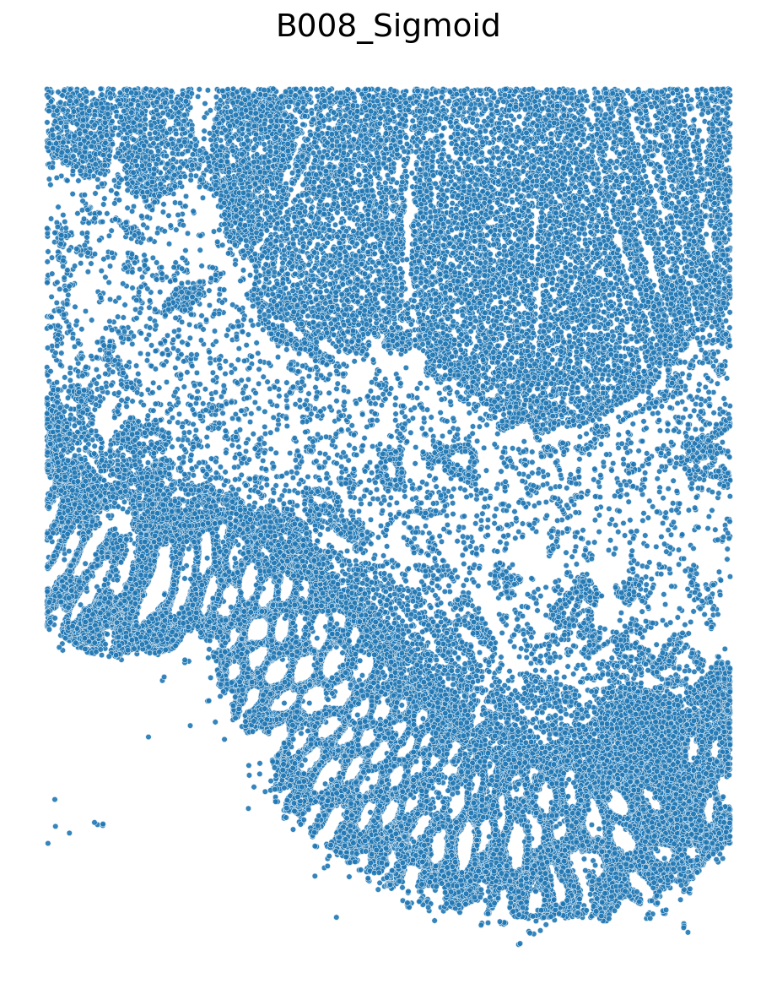

Spatial plot: community
Plotting 'B008_Sigmoid': 43783 points


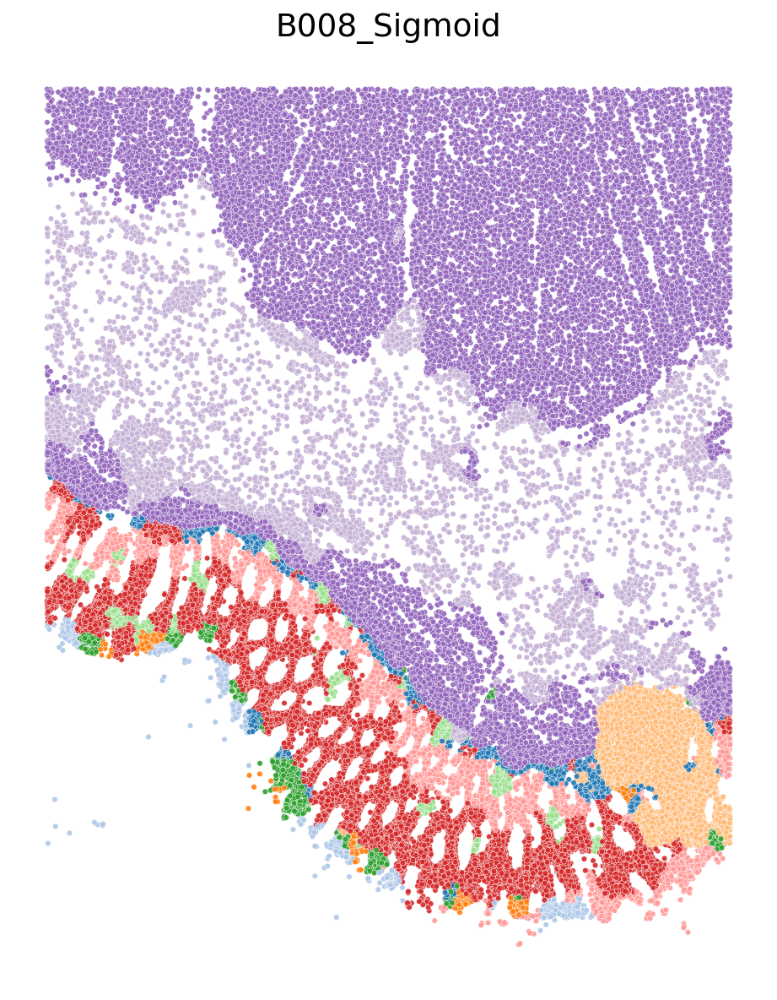

Spatial plot: neighborhood
Plotting 'B008_Sigmoid': 43783 points


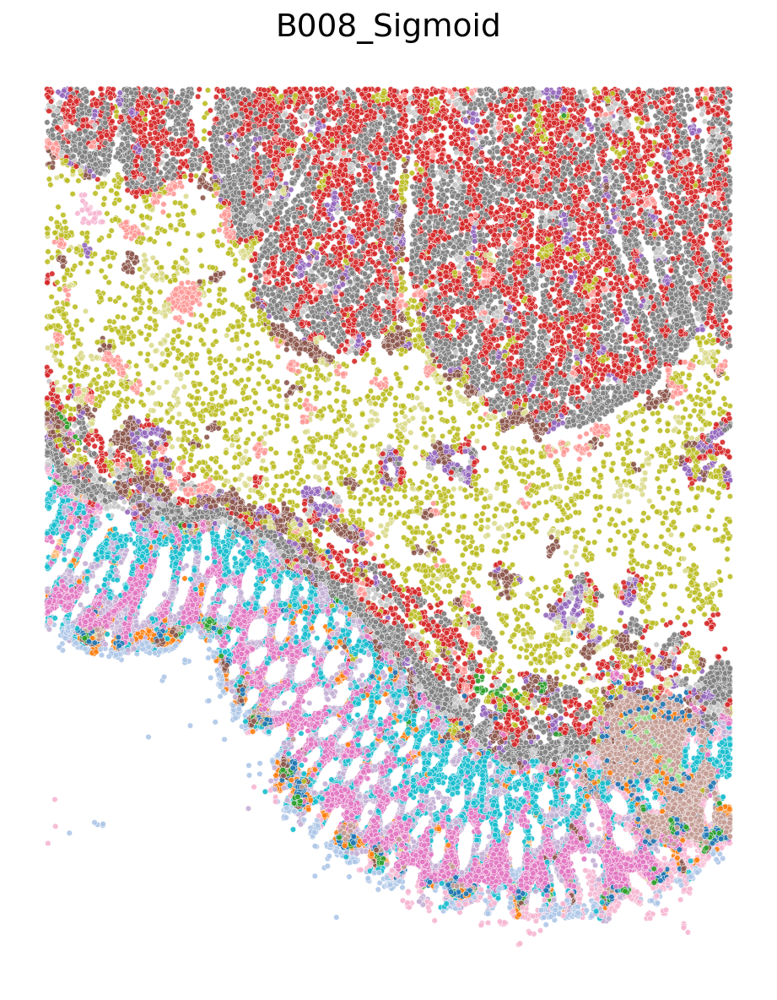

In [25]:
def resolve_column(df, query):
    """Find a column in df matching query (case-insensitive, substring allowed)."""
    query = query.lower()
    for c in df.columns:
        if c.lower() == query:
            return c
    for c in df.columns:
        if query in c.lower():
            return c
    raise KeyError(f"Column matching '{query}' not found. Available: {list(df.columns)}")


def catplot2(cells, hue, exp='Exp', X='X', Y='Y', invert_y=False, size=10,
             legend=True, palette="bright", figsize=6, style='white',
             exps=None, axis='on', scatter_kws=None,
             title_fontsize=20, legend_title_fontsize=12,
             legend_fontsize=10, dpi=150):

    if hasattr(cells, "obs"):
        df = cells.obs.copy()
    elif isinstance(cells, pd.DataFrame):
        df = cells.copy()
    else:
        raise TypeError("Input must be a pandas DataFrame or AnnData")

    df.columns = df.columns.astype(str)

    for key in [X, Y, hue, exp]:
        if key not in df.columns:
            raise KeyError(f"Column '{key}' not found in data")

    df[hue] = df[hue].astype("category")

    if scatter_kws is None:
        scatter_kws = {}

    scatter_kws = {**{'s': size, 'alpha': 0.9}, **scatter_kws}

    df_plot = df.copy()
    if invert_y:
        df_plot[Y] = -df_plot[Y]

    sns.set_style({'axes.facecolor': style})

    if exps is None:
        exps = list(df_plot[exp].unique())
    elif not isinstance(exps, (list, tuple, np.ndarray)):
        exps = [exps]

    figures = []

    for name in exps:

        data_sub = df_plot[df_plot[exp] == name]

        print(f"Plotting '{name}': {data_sub.shape[0]} points")

        fig, ax = plt.subplots(figsize=(figsize, figsize), dpi=dpi)

        sns.scatterplot(
            x=X, y=Y, hue=hue,
            data=data_sub, ax=ax,
            palette=palette, legend=False,
            **scatter_kws
        )

        ax.set_title(str(name), fontsize=title_fontsize)

        if axis == 'off':
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlabel('')
            ax.set_ylabel('')
            sns.despine(ax=ax, left=True, bottom=True)

        if legend:
            handles, labels = ax.get_legend_handles_labels()

            if len(handles) > 0:
                legend_obj = ax.legend(
                    handles, labels,
                    title=hue,
                    fontsize=legend_fontsize,
                    title_fontsize=legend_title_fontsize,
                    loc='center left',
                    bbox_to_anchor=(1.02, 0.5),
                    frameon=True,
                    markerscale=2
                )

                legend_obj.get_frame().set_alpha(0.9)

        plt.tight_layout(rect=(0, 0, 0.78, 1.0))
        plt.show()

        figures.append((fig, ax))

    return figures


def adata_catplot(cells, region='B008_Sigmoid', x_key='x', y_key='y',
                  neigh_key='Neighborhood', region_key='unique_region',
                  palette=None):

    if hasattr(cells, "obs"):
        adata = cells
        df = adata.obs
    elif isinstance(cells, pd.DataFrame):
        adata = None
        df = cells
    else:
        raise TypeError("cells must be AnnData or DataFrame")

    # resolve possible column name mismatches
    neigh_col = resolve_column(df, neigh_key)
    region_col = resolve_column(df, region_key)
    x_col = resolve_column(df, x_key)
    y_col = resolve_column(df, y_key)

    if adata is not None:
        adata_reg = adata[adata.obs[region_col] == region]

        assigned_neighborhoods = adata_reg.obs[neigh_col].astype(str)

        visualization_df = pd.DataFrame({
            'x': adata_reg.obs[x_col],
            'y': adata_reg.obs[y_col],
            'Assigned Neighborhood': assigned_neighborhoods,
            region_col: adata_reg.obs[region_col]
        }, index=adata_reg.obs_names)

    else:
        visualization_df = df.copy()

    plt.rcParams["legend.markerscale"] = 15

    figs = catplot2(
        visualization_df,
        X='x', Y='y', exp=region_col,
        hue='Assigned Neighborhood',
        axis='off', invert_y=False,
        size=10, figsize=8, legend=True,
        legend_title_fontsize=18,
        legend_fontsize=12,
        title_fontsize=18,
        palette=palette if palette is not None else "tab20",
        dpi=150
    )

    return figs


for level in results:

    print(f"Spatial plot: {level}")

    figs = adata_catplot(
        results[level]["cells"],
        neigh_key=level
    )

Building tissue network


C:\Users\annet\AppData\Local\Temp\ipykernel_12724\3795808231.py:115: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20")


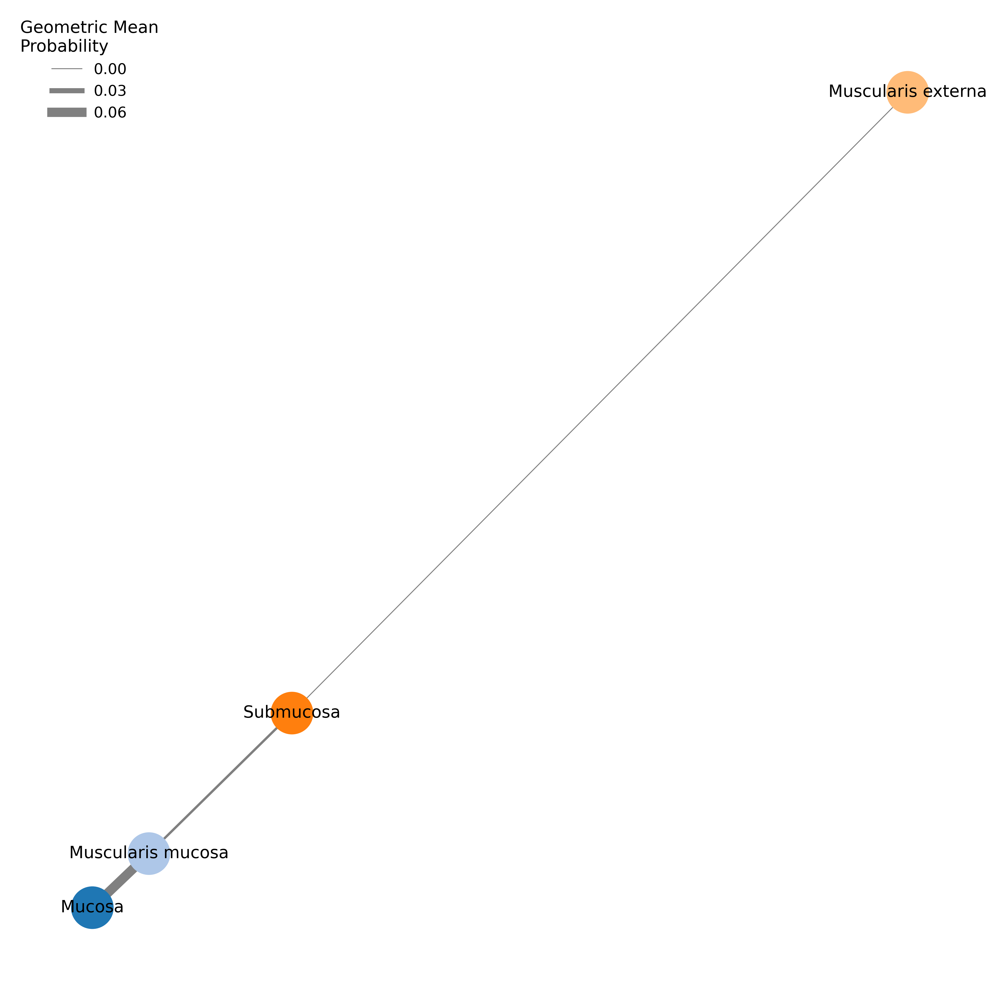

Building community network


C:\Users\annet\AppData\Local\Temp\ipykernel_12724\3795808231.py:115: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20")


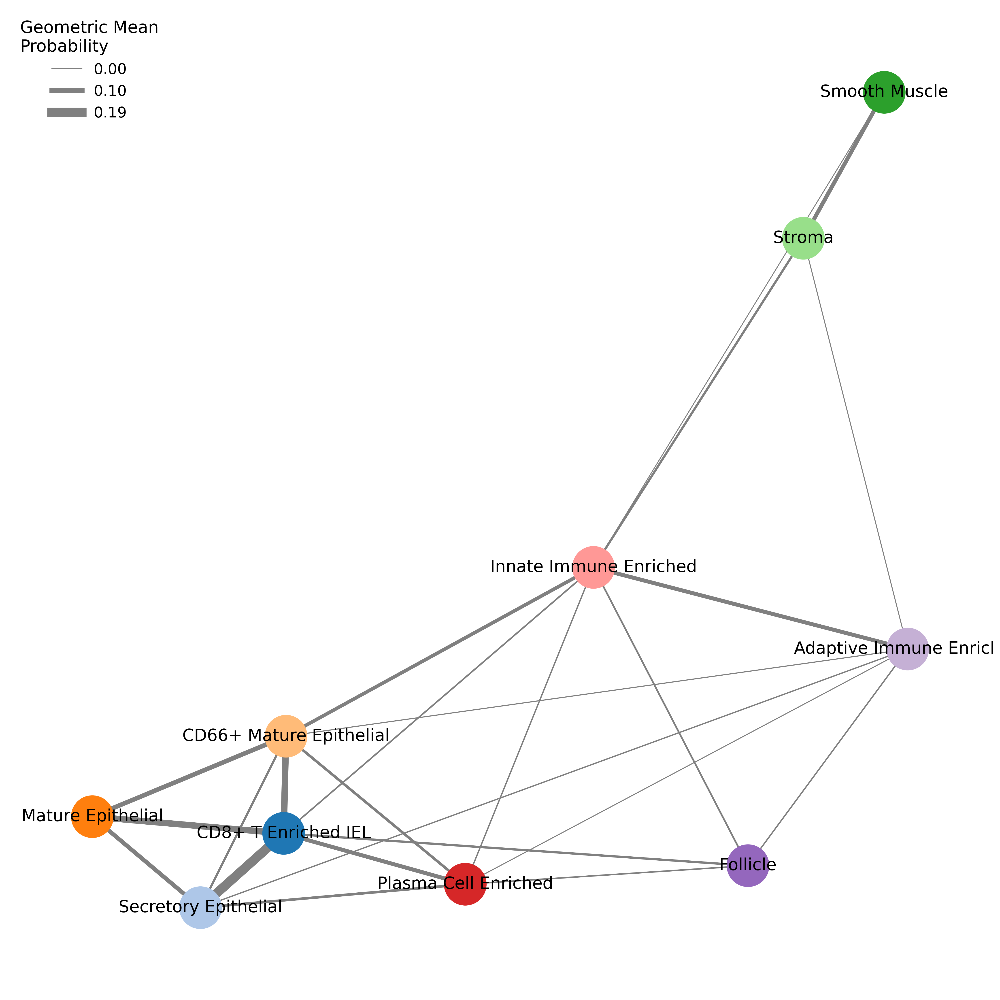

Building neighborhood network


C:\Users\annet\AppData\Local\Temp\ipykernel_12724\3795808231.py:115: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20")


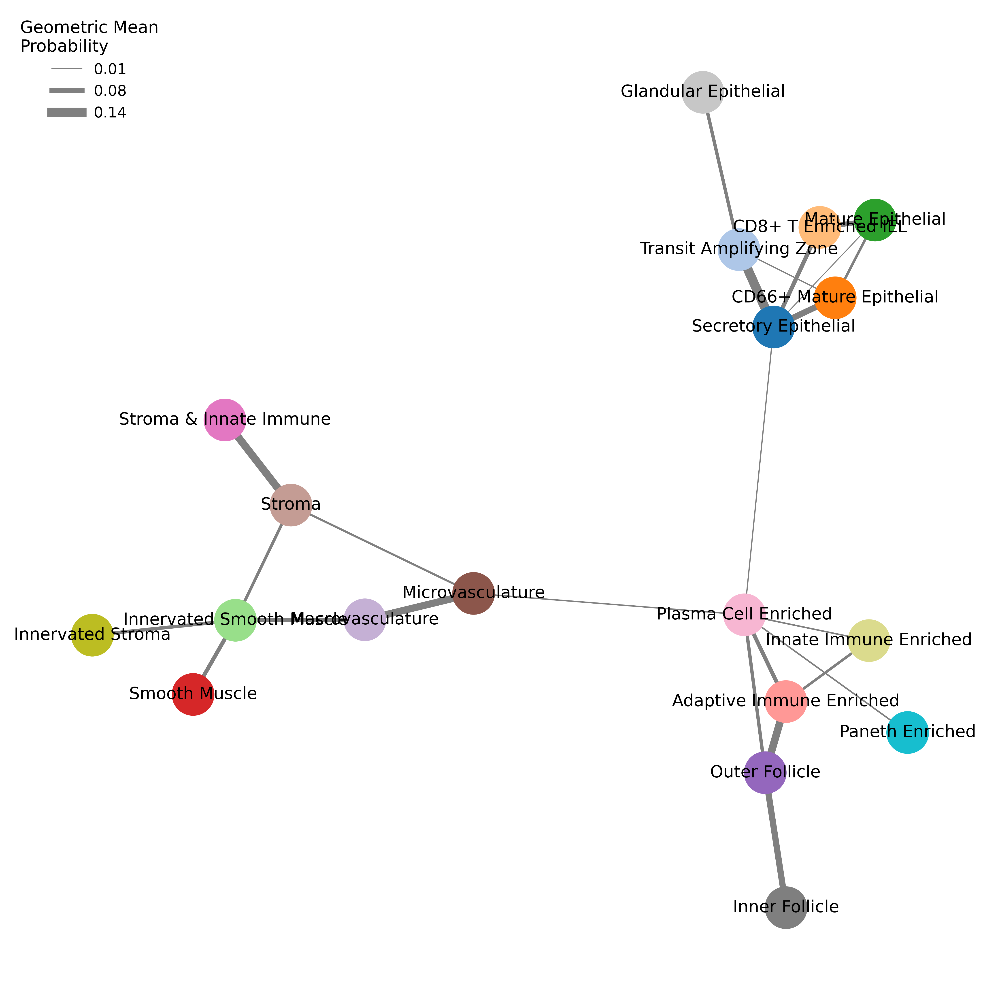

In [11]:

def build_geometric_network(
        cells,
        neighborhood_col,
        region_key="unique_region",
        threshold=0.25,
        top_n=24,
        figsize=(15,15),
        dpi=300,
        node_size=2000,
        min_width=1,
        max_width=10,
        spring_k=2,
        spring_seed=28
):

    # -----------------------------------
    # Detect probability columns automatically
    # -----------------------------------
    prob_cols = sorted(
        cells.obs[neighborhood_col]
        .dropna()
        .unique()
        .tolist()
    )

    probs = cells.obs[prob_cols].apply(pd.to_numeric, errors="coerce")

    # -----------------------------------
    # Identify cells with exactly two neighborhoods
    # -----------------------------------
    counts = (probs > threshold).sum(axis=1)
    mask = counts == 2

    probs2 = probs.loc[mask]
    regions = cells.obs.loc[mask, region_key]

    above = probs2.gt(threshold)

    pair_list = []
    region_list = []

    for idx in above.index:

        cols = list(above.columns[above.loc[idx].values])

        if len(cols) == 2:
            pair_list.append((cols[0], cols[1]))
            region_list.append(regions.loc[idx])

    pairs_df = pd.DataFrame(pair_list, columns=["n1","n2"])
    pairs_df[region_key] = region_list

    pair_counts = (
        pairs_df.groupby([region_key,"n1","n2"])
        .size()
        .reset_index(name="count")
    )

    pair_counts_summed = (
        pair_counts.groupby(["n1","n2"],as_index=False)["count"]
        .sum()
    )

    pair_counts_summed = (
        pair_counts_summed
        .sort_values("count",ascending=False)
        .head(top_n)
    )

    # -----------------------------------
    # Build graph
    # -----------------------------------
    G = nx.Graph()

    for _,row in pair_counts_summed.iterrows():
        G.add_edge(row["n1"],row["n2"],weight=row["count"])

    # -----------------------------------
    # Compute totals
    # -----------------------------------
    totals = (probs > threshold).sum(axis=0).to_dict()

    # -----------------------------------
    # Compute geometric mean enrichment
    # -----------------------------------
    enrichments = []

    for u,v in G.edges():

        cnt = G[u][v]["weight"]

        prop_u = cnt / totals.get(u,1)
        prop_v = cnt / totals.get(v,1)

        enr = np.sqrt(prop_u * prop_v)

        enrichments.append(enr)

    # -----------------------------------
    # Normalize edge widths
    # -----------------------------------
    e_min = min(enrichments)
    e_max = max(enrichments)

    widths = [
        min_width + (e - e_min)/(e_max - e_min)*(max_width-min_width)
        for e in enrichments
    ]

    # -----------------------------------
    # Plot graph
    # -----------------------------------
    pos = nx.spring_layout(G,k=spring_k,seed=spring_seed)

    cmap = get_cmap("tab20")

    node_colors = [cmap(i % 20) for i in range(len(G.nodes()))]

    fig = plt.figure(figsize=figsize,dpi=dpi)

    nx.draw_networkx_nodes(G,pos,node_size=node_size,node_color=node_colors)
    nx.draw_networkx_edges(G,pos,width=widths,edge_color="gray")
    nx.draw_networkx_labels(G,pos,font_size=18)

    # -------------------------------
    # Legend for geometric mean values
    # -------------------------------
    legend_levels = [e_min, (e_min + e_max) / 2.0, e_max]

    def to_width(e):
        return min_width + (e - e_min) / (e_max - e_min) * (max_width - min_width)

    legend_handles = [
        mlines.Line2D([], [], color="gray", linewidth=to_width(e), label=f"{e:.2f}")
        for e in legend_levels
    ]

    ax = plt.gca()

    ax.legend(
        handles=legend_handles,
        title="Geometric Mean\nProbability",
        fontsize=16,
        title_fontsize=18,
        loc="upper left",
        frameon=False
    )

    plt.axis("off")
    plt.tight_layout()

    return fig

figures = {}

for level in results:

    print(f"Building {level} network")

    cells_level = results[level]["cells"]

    neighborhood_col = levels[level]["neighborhood_col"]

    fig = build_geometric_network(
        cells_level,
        neighborhood_col=neighborhood_col
    )

    figures[level] = fig

    plt.show()